In [1]:
import warnings
warnings.filterwarnings("ignore")

#import snapatac2 as snap
import anndata as ad
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
import bin.utils as myutils
import h5py
lustre_path='/lustre/scratch127/cellgen/cellgeni/tickets/' + os.getcwd().split('/')[4]
lustre_path

'/lustre/scratch127/cellgen/cellgeni/tickets/tic-3942'

In [2]:
sc.logging.print_header()

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 pynndescent==0.5.10


# Snapatac2 gene scores

In [ ]:
# integration done using scvi/scanvi with dataset_donor as a batch (see 03.run.scanvi.sh)
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi.h5ad')
data.raw = sc.read_h5ad(lustre_path+'/data/combined_gene_matrix_plus_ref_clean.h5ad')
data

In [ ]:
data.raw.X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 1734295358 stored elements and shape (421566, 19446)>

In [ ]:
# to use for knn annotation annoy is not working
sc.external.pp.bbknn(data,batch_key='dataset',use_annoy=False,neighbors_within_batch=50,use_rep='X_scANVI')

In [ ]:
sc.tl.leiden(data,resolution=0.5,key_added='leiden_0.5',flavor='igraph')
sc.tl.leiden(data,resolution=1,key_added='leiden_1',flavor='igraph')
sc.tl.leiden(data,resolution=2,key_added='leiden_2',flavor='igraph')
sc.tl.leiden(data,resolution=3,key_added='leiden_3',flavor='igraph')

## Add QC metrics

In [33]:
qc = pd.read_csv(lustre_path+"/work/pycistopic/results_pycistopic_combine/combined_cistopic_object_cell_data.csv")
qc.index = qc.sample_id +":"+qc.barcode
qc[:2]

,Unnamed: 0,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,...,log10_unique_fragments_in_peaks_count,fraction_of_fragments_in_peaks,duplication_count,duplication_ratio,nucleosome_signal,tss_enrichment,pdf_values_for_tss_enrichment,pdf_values_for_fraction_of_fragments_in_peaks,pdf_values_for_duplication_ratio,barcode
HCA_P_GON_CZI14524754:TTAACGGCACTGTCAA-1,TTAACGGCACTGTCAA-1___HCA_P_GON_CZI14524754,35278,4.547504,21083,4.323932,HCA_P_GON_CZI14524754,604,189699,5.278067,50435,...,4.545530,0.696282,139264,0.734131,0.224573,25.736961,0.006075,0.366632,0.231301,TTAACGGCACTGTCAA-1
HCA_P_GON_CZI14524754:GGCGAAAAGTAGTCGG-1,GGCGAAAAGTAGTCGG-1___HCA_P_GON_CZI14524754,30721,4.487435,20655,4.315025,HCA_P_GON_CZI14524754,809,112774,5.052213,43810,...,4.484897,0.697124,68964,0.611524,0.304576,26.334541,0.005665,0.338143,0.073149,GGCGAAAAGTAGTCGG-1


In [34]:
with h5py.File(lustre_path+'/work/results_snapatac2_combine/full_adatas/full.h5ads',"r") as f:
    qc_snap = ad._io.h5ad.read_elem(f['obs'])
qc_snap[:2]

,sample,leiden,tsse
index,,,
HCA_P_GON_CZI14524754:AAACGAAGTACGCCCA-1,HCA_P_GON_CZI14524754,7,22.005098
HCA_P_GON_CZI14524754:AAACGAATCGCTTGAA-1,HCA_P_GON_CZI14524754,0,25.140292


In [35]:
pd.Series(qc_snap.index.isin(qc.index)).value_counts()

True     125382
False      1725
Name: count, dtype: int64

In [36]:
qc_snap['pycis_tsse'] = pd.NA
cmn = qc_snap.index[qc_snap.index.isin(qc.index)]
qc_snap.loc[cmn,'pycis_tsse'] = qc.loc[cmn,'tss_enrichment']

In [37]:
qc_snap.tsse.min()

np.float64(10.0)

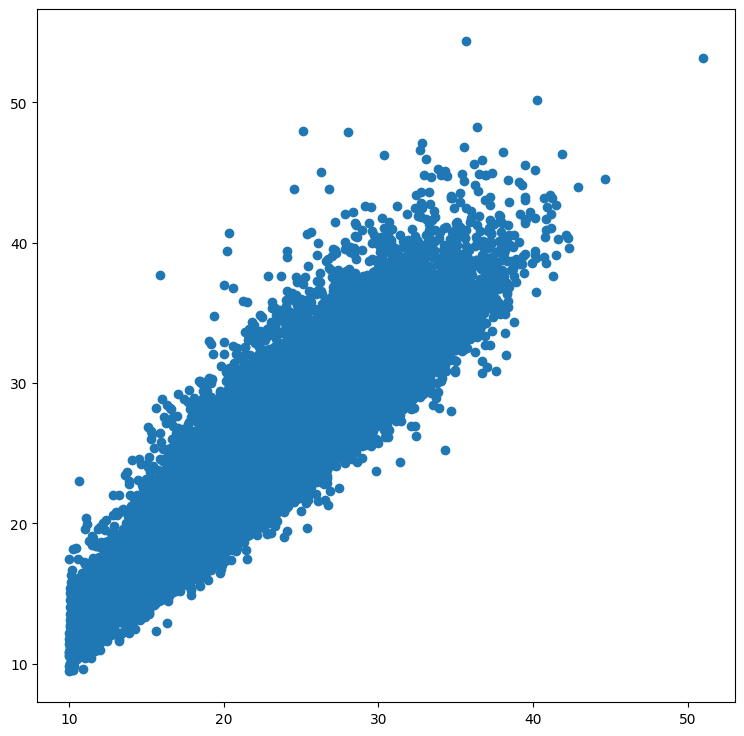

In [38]:
plt.scatter(qc_snap.loc[cmn,'tsse'],qc_snap.loc[cmn,'pycis_tsse'])

In [39]:
data.obs['tsse'] = np.nan
qc_snap.index = qc_snap.index + "_atac"
data.obs.loc[pd.Series(qc_snap.index),'tsse'] = qc_snap.tsse
data.obs

,Sampling_site_II,Developmental_stage,coarse_annotation,Donor,Dataset,Sample,Age,Sampling_site,sample,dataset,...,_scvi_labels,C_scANVI,leiden_0.5,leiden_1,leiden_2,leiden_3,tsse,coarse_annotation_bbknn,coarse_annotation_bbknn_confidence,log10_total_counts
HCA_P_GON_CZI12935964_AAACCTGAGACTGGGT-Sanger_pediatric_reference,Cortex_outer,paediatric,Endo_Cap_LY6H+_angiogenic,AUrv5,Sanger_pediatric,HCA_P_GON_CZI12935964,5.0,Cortex,NaN,reference,...,3,Endo_Cap_LY6H+_angiogenic,0,0,0,0,NaN,Endo_Cap_LY6H+_angiogenic,1.00,3.129045
HCA_P_GON_CZI12935964_AAACCTGCAAGTTGTC-Sanger_pediatric_reference,Cortex_outer,paediatric,PV_Capillary_Pericytes,AUrv5,Sanger_pediatric,HCA_P_GON_CZI12935964,5.0,Cortex,NaN,reference,...,38,PV_Capillary_Pericytes,1,1,2,1,NaN,PV_Capillary_Pericytes,1.00,3.548144
HCA_P_GON_CZI12935964_AAACCTGCAGACACTT-Sanger_pediatric_reference,Cortex_outer,paediatric,PV_SMC_Arterial,AUrv5,Sanger_pediatric,HCA_P_GON_CZI12935964,5.0,Cortex,NaN,reference,...,41,PV_SMC_Arterial,2,2,4,2,NaN,PV_SMC_Arterial,1.00,4.246794
HCA_P_GON_CZI12935964_AAACCTGCATTCACTT-Sanger_pediatric_reference,Cortex_outer,paediatric,PV_SMC_Arterial,AUrv5,Sanger_pediatric,HCA_P_GON_CZI12935964,5.0,Cortex,NaN,reference,...,41,PV_SMC_Arterial,2,2,3,4,NaN,PV_SMC_Arterial,1.00,3.854549
HCA_P_GON_CZI12935964_AAACCTGGTTACGCGC-Sanger_pediatric_reference,Cortex_outer,paediatric,FibC3,AUrv5,Sanger_pediatric,HCA_P_GON_CZI12935964,5.0,Cortex,NaN,reference,...,8,FibC3,3,3,6,5,NaN,FibC3,1.00,3.793790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCA_P_GON_CZI14609780:TTTGTGTGTCTGAGCC-1_atac,Cortex_outer,pubertal,NaN,AUrv31,Sanger_pediatric,HCA_P_GON_CZI14609780,15.0,Cortex,HCA_P_GON_CZI14609780,atac,...,58,Granulosa_AMH_ml,5,6,13,38,20.340092,Stroma_OutCor_Foll,0.62,4.041156
HCA_P_GON_CZI14609780:TTTGTGTGTGGTCGAA-1_atac,Cortex_outer,pubertal,NaN,AUrv31,Sanger_pediatric,HCA_P_GON_CZI14609780,15.0,Cortex,HCA_P_GON_CZI14609780,atac,...,58,Immune_Mac_resident_LYVE1+_C1QC+,5,8,16,18,17.603598,Stroma_OutCor_Foll,0.86,4.237343
HCA_P_GON_CZI14609780:TTTGTGTGTTCAGTTG-1_atac,Cortex_outer,pubertal,NaN,AUrv31,Sanger_pediatric,HCA_P_GON_CZI14609780,15.0,Cortex,HCA_P_GON_CZI14609780,atac,...,58,PV_Cycling,1,1,2,1,23.663102,PV_SMC_Arterial,0.88,4.239575
HCA_P_GON_CZI14609780:TTTGTGTGTTTCCTAT-1_atac,Cortex_outer,pubertal,NaN,AUrv31,Sanger_pediatric,HCA_P_GON_CZI14609780,15.0,Cortex,HCA_P_GON_CZI14609780,atac,...,58,Stroma_OutCor_Foll,5,8,16,18,22.808928,Stroma_OutCor_Foll,1.00,4.201998


## Check umap and predictions
C_scANVI - scanvi prediction based on coarse_annotation

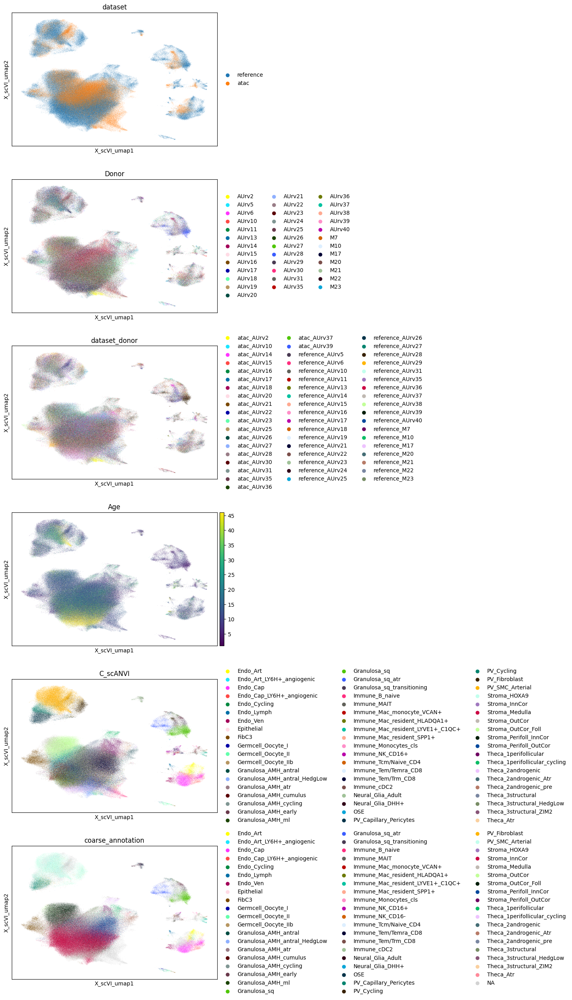

In [16]:
# prediction is in C_scANVI
sc.pl.embedding(data,color=['dataset','Donor','dataset_donor','Age','C_scANVI','coarse_annotation'],ncols=1,basis='X_scVI_umap')

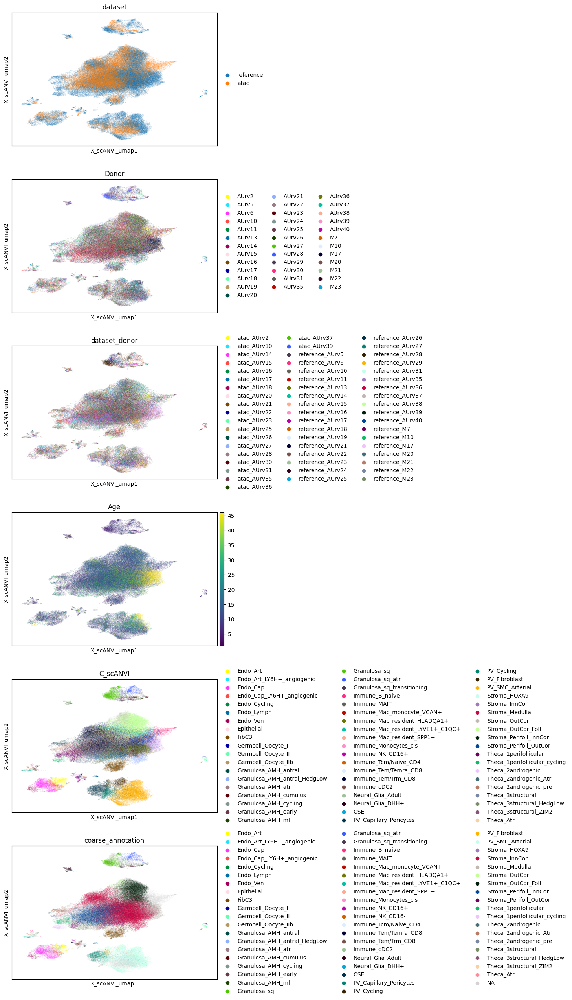

In [17]:
# prediction is in C_scANVI
sc.pl.embedding(data,color=['dataset','Donor','dataset_donor','Age','C_scANVI','coarse_annotation'],ncols=1,basis='X_scANVI_umap')

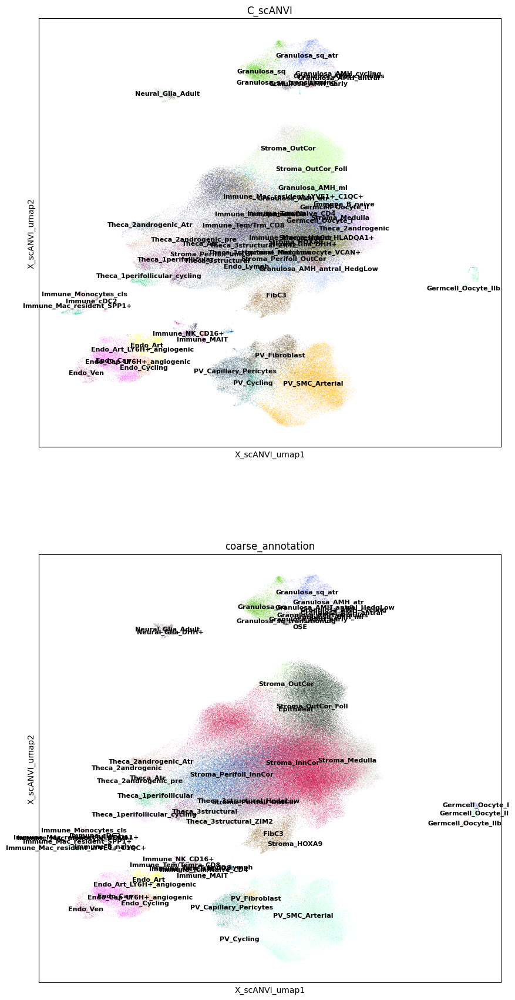

In [18]:
plt.rcParams['figure.figsize'] = [10, 10]
sc.pl.embedding(data[data.obs.dataset=='reference',:],color=['C_scANVI','coarse_annotation'],ncols=1,legend_loc='on data', legend_fontsize=8,basis='X_scANVI_umap')

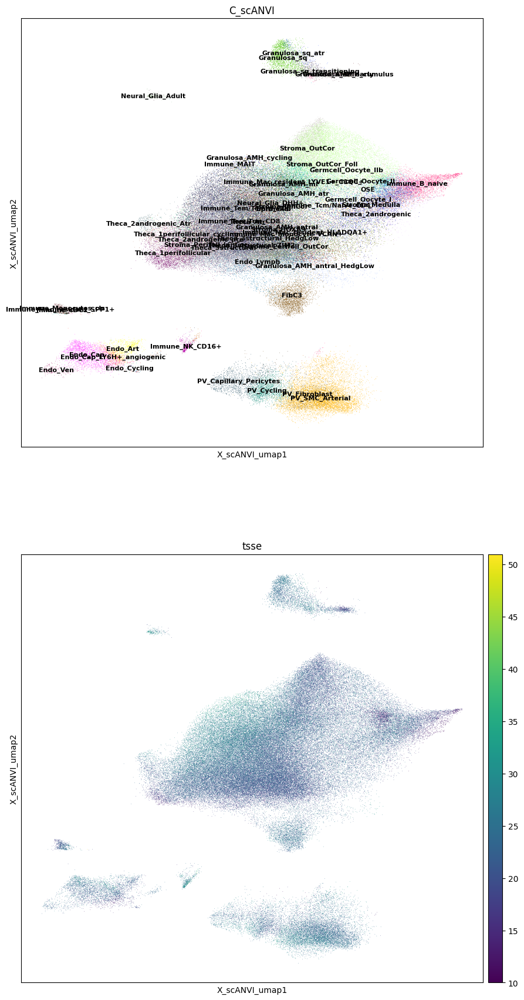

In [19]:
plt.rcParams['figure.figsize'] = [10, 10]
sc.pl.embedding(data[data.obs.dataset=='atac',:],color=['C_scANVI','tsse'],ncols=1,legend_loc='on data', legend_fontsize=8,basis='X_scANVI_umap')

## Check predictions in reference

In [20]:
pd.set_option('display.max_rows', 100)
f = data.obs.dataset=='reference'
t = pd.crosstab(data.obs.coarse_annotation[f],data.obs.coarse_annotation.astype(str)[f] == data.obs.C_scANVI[f])
t['f_lost'] = t[False]/(t[False]+t[True])
t = t.sort_values(by=[False],ascending=False)
t['major_prediction'] = ''
t['major_prediction_f'] = pd.NA
for c in t.index:
    cc = data.obs.C_scANVI[f & (data.obs.coarse_annotation==c)].value_counts()
    t.loc[c,'major_prediction'] = cc.index[0]
    t.loc[c,'major_prediction_f'] = cc[0]/cc.sum()
t.sort_values(False,ascending=False)

col_0,False,True,f_lost,major_prediction,major_prediction_f
coarse_annotation,,,,,
Stroma_InnCor,107585,1820,0.983365,Immune_Mac_resident_HLADQA1+,0.190723
Stroma_Perifoll_InnCor,29753,958,0.968806,Immune_Tem/Trm_CD8,0.41871
Stroma_Medulla,16238,143,0.991270,Theca_2androgenic,0.42763
PV_SMC_Arterial,9535,28059,0.253631,PV_SMC_Arterial,0.746369
Stroma_OutCor_Foll,9383,26237,0.263419,Stroma_OutCor_Foll,0.736581
Stroma_Perifoll_OutCor,3068,1812,0.628689,Stroma_Perifoll_OutCor,0.371311
Theca_3structural_HedgLow,1437,3780,0.275446,Theca_3structural_HedgLow,0.724554
Endo_Cap,902,6026,0.130196,Endo_Cap,0.869804
Stroma_OutCor,694,2214,0.238652,Stroma_OutCor,0.761348


scanvi annotation looks strange, it annotated  
**Stroma_InnCor**  as **Immune_Mac_resident_HLADQA1+**
**Stroma_Medulla** as **Theca_2androgenic**   
**Stroma_Perifoll_InnCor** as **Immune_Tem/Trm_CD8**  
So I'll use bbknn to annotate by neighbors

## Annotate ATAC

In [21]:
%%time
res = myutils.annotateByKnn(data,knn_key = 'distances',ann_key = 'coarse_annotation')
res

CPU times: user 5min 15s, sys: 1.45 s, total: 5min 17s
Wall time: 5min 21s


,coarse_annotation,major_cnt,total,confidence
HCA_P_GON_CZI12935964_AAACCTGAGACTGGGT-Sanger_pediatric_reference,Endo_Cap_LY6H+_angiogenic,38,49,0.77551
HCA_P_GON_CZI12935964_AAACCTGCAAGTTGTC-Sanger_pediatric_reference,PV_Capillary_Pericytes,49,49,1.00000
HCA_P_GON_CZI12935964_AAACCTGCAGACACTT-Sanger_pediatric_reference,PV_SMC_Arterial,49,49,1.00000
HCA_P_GON_CZI12935964_AAACCTGCATTCACTT-Sanger_pediatric_reference,PV_SMC_Arterial,49,49,1.00000
HCA_P_GON_CZI12935964_AAACCTGGTTACGCGC-Sanger_pediatric_reference,FibC3,49,49,1.00000
...,...,...,...,...
HCA_P_GON_CZI14609780:TTTGTGTGTCTGAGCC-1_atac,Stroma_OutCor_Foll,31,50,0.62000
HCA_P_GON_CZI14609780:TTTGTGTGTGGTCGAA-1_atac,Stroma_OutCor_Foll,43,50,0.86000
HCA_P_GON_CZI14609780:TTTGTGTGTTCAGTTG-1_atac,PV_SMC_Arterial,44,50,0.88000
HCA_P_GON_CZI14609780:TTTGTGTGTTTCCTAT-1_atac,Stroma_OutCor_Foll,50,50,1.00000


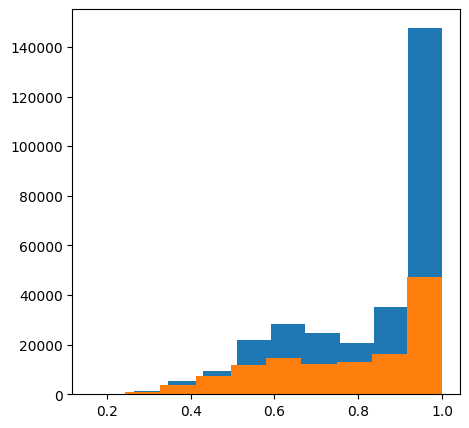

In [22]:
plt.rcParams['figure.figsize'] = [5, 5]
n=plt.hist(res.confidence[(data.obs.dataset=='reference').tolist()])
n=plt.hist(res.confidence[(data.obs.dataset=='atac').tolist()])

In [23]:
# bbknn predicted annotation for atac and reference one for reference
data.obs['coarse_annotation_bbknn'] = res['coarse_annotation']
data.obs['coarse_annotation_bbknn'][data.obs.dataset=='reference'] = data.obs['coarse_annotation'][data.obs.dataset=='reference']
data.obs['coarse_annotation_bbknn_confidence'] = res['confidence']
data.obs['coarse_annotation_bbknn_confidence'][data.obs.dataset=='reference'] = 1
data.obs['coarse_annotation_bbknn'] = data.obs['coarse_annotation_bbknn'].astype('category')
data.obs['coarse_annotation'] = data.obs['coarse_annotation'].astype('category')

In [24]:
cmap = plt.get_cmap('nipy_spectral')
n = len(data.obs['coarse_annotation'].cat.categories)
colors = [mcolors.to_hex(cmap(i / n)) for i in range(n)]
#colors = dict(zip(data.obs['coarse_annotation'].cat.categories, colors))
data.uns['coarse_annotation_bbknn_colors'] = colors
data.uns['coarse_annotation_colors'] = colors

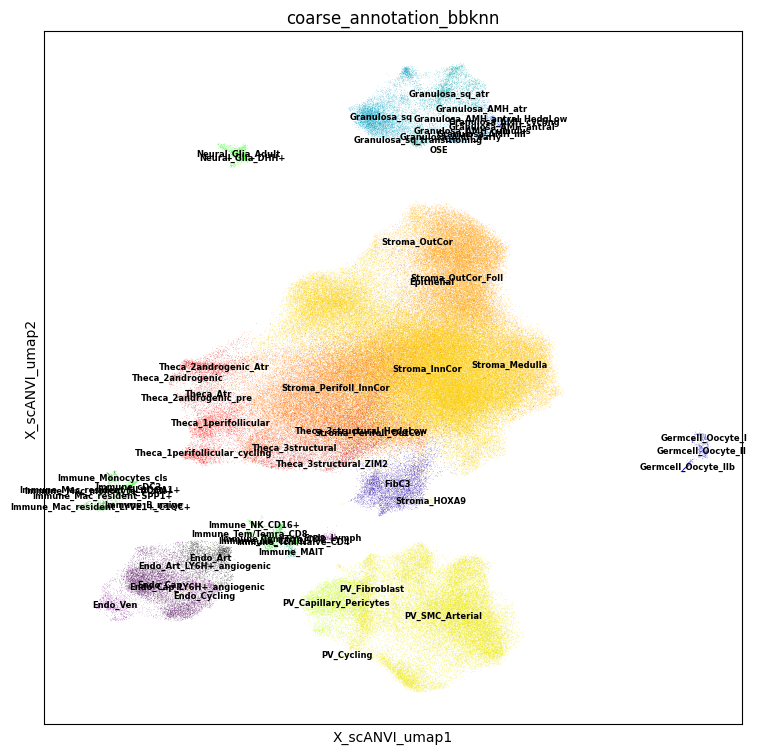

In [25]:
plt.rcParams['figure.figsize'] = [9, 9]
sc.pl.embedding(data[data.obs.dataset=='reference'],color=['coarse_annotation_bbknn'],ncols=1,legend_loc='on data',legend_fontsize=6,basis='X_scANVI_umap')

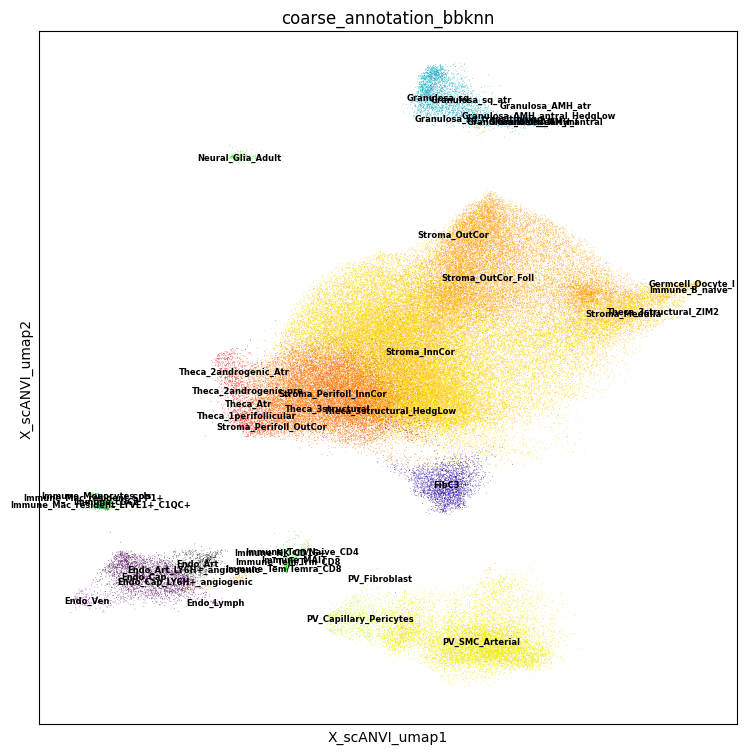

In [26]:
sc.pl.embedding(data[data.obs.dataset=='atac'],color=['coarse_annotation_bbknn'],ncols=1,legend_loc='on data',legend_fontsize=6,basis='X_scANVI_umap')

In [27]:
data.obs['total_counts'] = np.asarray(data.raw.X.sum(1))[:,0]
data.obs['log10_total_counts'] = np.log10(data.obs['total_counts'])

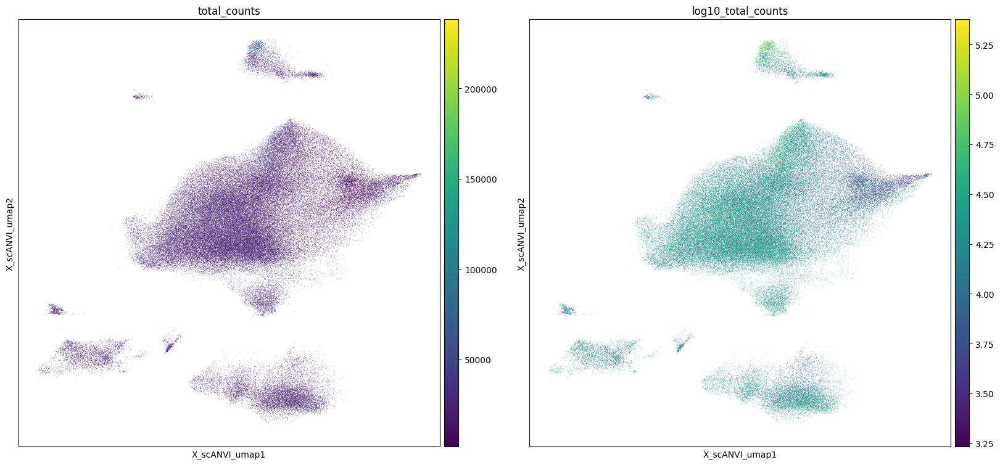

In [63]:
sc.pl.embedding(data[data.obs.dataset=='atac'],color=['total_counts','log10_total_counts'],basis='X_scANVI_umap')

In [51]:
data.obs.coarse_annotation_bbknn = data.obs.coarse_annotation_bbknn.str.replace('/','_')
data.obs.coarse_annotation_bbknn.value_counts()

coarse_annotation_bbknn
Stroma_InnCor                       161388
Stroma_OutCor_Foll                   57750
Stroma_Perifoll_InnCor               51016
PV_SMC_Arterial                      49553
Stroma_Medulla                       21165
Endo_Cap                              9703
FibC3                                 8865
Granulosa_sq                          8732
PV_Capillary_Pericytes                6299
Theca_3structural_HedgLow             6215
Stroma_Perifoll_OutCor                5168
Granulosa_sq_atr                      3540
Theca_1perifollicular                 3519
Theca_3structural                     3336
Stroma_OutCor                         3078
Theca_2androgenic_Atr                 2996
Endo_Art                              2930
PV_Fibroblast                         1586
Theca_1perifollicular_cycling         1455
Granulosa_AMH_early                   1321
Endo_Cap_LY6H+_angiogenic             1171
Immune_Tem_Trm_CD8                    1156
Endo_Ven                      

In [53]:
data.write_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')

### Per-cluster majority

In [ ]:
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')

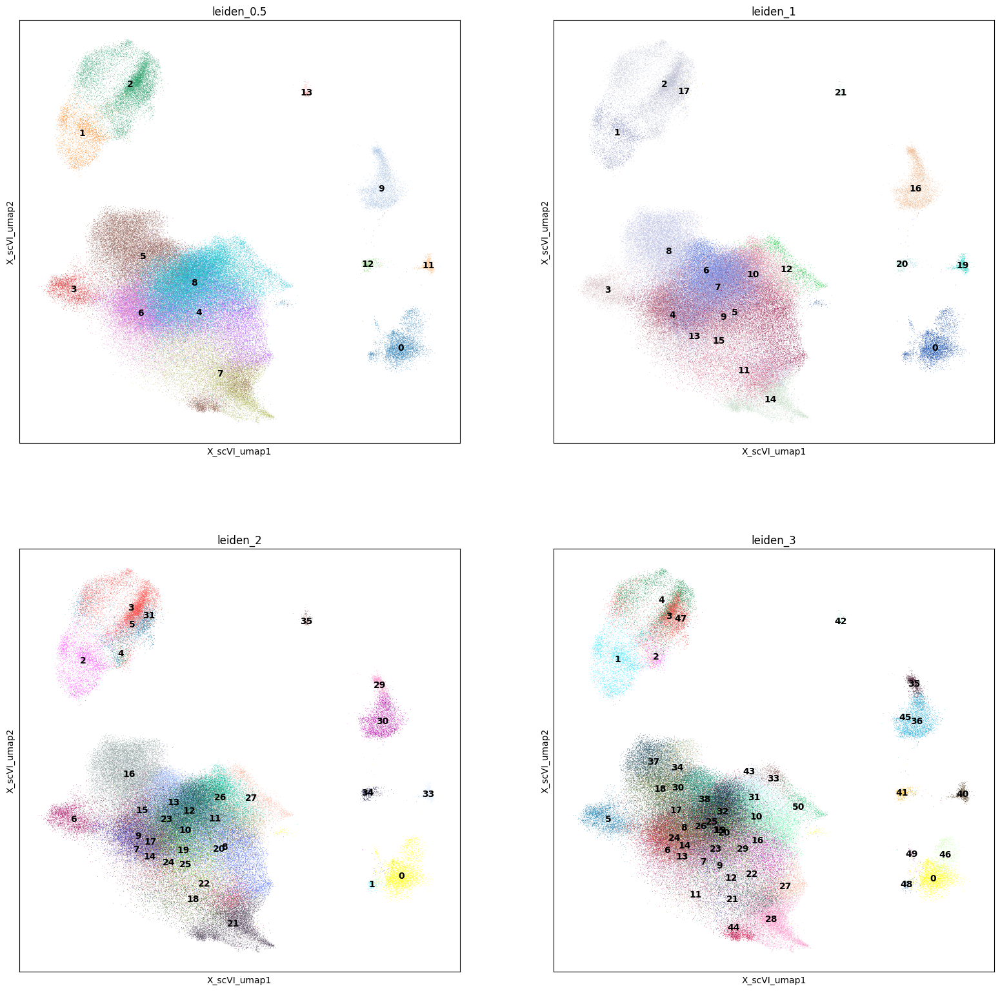

In [45]:
sc.pl.embedding(data[data.obs.dataset=='atac'],color=['leiden_0.5','leiden_1','leiden_2','leiden_3'],ncols=2,legend_loc='on data',basis='X_scVI_umap')

In [29]:
f = data.obs.dataset=='atac'
clann = myutils.getMajorAnn(data.obs.coarse_annotation_bbknn[f],
                            data.obs.leiden_3[f])
#clann[clann.major_frac<0.5]
clann.sort_values('major_frac')

,cluster,major_ann,major_ann_cnt,total,major_frac
leiden_3,,,,,
21,21,Stroma_Perifoll_InnCor,910,1909,0.476689
18,18,Stroma_Medulla,1704,3533,0.482310
24,24,Stroma_InnCor,3346,6600,0.506970
1,1,PV_SMC_Arterial,1498,2768,0.541185
33,33,Stroma_Medulla,1850,3387,0.546206
40,40,Immune_cDC2,297,532,0.558271
41,41,Stroma_Perifoll_InnCor,2315,3999,0.578895
30,30,Stroma_Medulla,1083,1828,0.592451
11,11,Stroma_OutCor_Foll,2056,3423,0.600643


In [25]:
len(clann.major_ann.unique())

26

In [26]:
cc = data.obs.coarse_annotation_bbknn[data.obs.dataset=='atac'].value_counts()
cc[~cc.index.isin(clann.major_ann.unique())]

coarse_annotation_bbknn
Stroma_OutCor                   541
Endo_Art                        500
Stroma_Perifoll_OutCor          465
Granulosa_sq_AMH                382
Immune_cDC2                     300
Oocyte_postnatal_EML6           223
Endo_Cap_LY6H+_angiogenic       143
Immune_Mac_resident_SPP1+        73
Immune_Tcm/Naive_CD4             32
Immune_Monocytes_cls             31
PV_Fetal                          8
Theca_Atr                         7
Endo_Art_LY6H+_angiogenic         7
Immune_Mac_resident_HLADQA1+      5
Immune_MAIT                       5
Immune_NK_CD16+                   5
Theca_2androgenic_pre             5
Theca_3structural                 2
Immune_NK_CD16-                   1
Immune_Mac_monocyte_VCAN+         1
Endo_Cap_VCAN+_activated          0
Endo_Cap_CA2+_angiogenic          0
Epithelial                        0
FibC3_other                       0
Immune_Mast                       0
Immune_B_naive                    0
Granulosa_AMH_preAtr              0
Endo

In [33]:
f = data.obs.leiden_3 == '18'
pd.crosstab(data.obs.coarse_annotation_bbknn[f],data.obs.dataset[f])

dataset,reference,atac
coarse_annotation_bbknn,,
Endo_Cap,0,4
FibC3,0,8
Granulosa_sq,0,1
Granulosa_sq_resting,1,50
Immune_Mac_resident_LYVE1+_C1QC+,0,2
Immune_Tem/Trm_CD8,0,1
Oocyte_early,1,0
Oocyte_postnatal_EML6,68,223
PV_Fibroblast,1,9


## Cell type abundance in ref and atac

In [3]:
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')

In [5]:
pd.set_option('display.max_rows', 1000)
ctcounts = pd.crosstab(data.obs.coarse_annotation_bbknn,data.obs.dataset)
ctcounts['atac_iodds'] = ctcounts.atac/ctcounts.atac.sum()/ctcounts.reference*ctcounts.reference.sum()
ctcounts['frac_diff'] = ctcounts.atac/ctcounts.atac.sum() - ctcounts.reference/ctcounts.reference.sum()
ctcounts['ncell_diff'] = (ctcounts['frac_diff']  * ctcounts.atac.sum()).round()
ctcounts = ctcounts.sort_values('ncell_diff',ascending=True)
ctcounts 

dataset,reference,atac,atac_iodds,frac_diff,ncell_diff
coarse_annotation_bbknn,,,,,
Granulosa_AMH,16194,29,0.004797,-0.047335,-6017.0
PV_SMC_Arterial,40477,11824,0.782483,-0.025860,-3287.0
Granulosa_AMH_Atr,6853,11,0.004300,-0.020041,-2547.0
Granulosa_AMH_cycling,5666,0,0.000000,-0.016642,-2115.0
Stroma_Medulla,23707,6896,0.779183,-0.015375,-1954.0
Stroma_Perifoll_OutCor,4983,465,0.249966,-0.010977,-1395.0
Theca_3structural_HedgLow,5248,617,0.314927,-0.010560,-1342.0
Theca_3structural,2934,2,0.001826,-0.008602,-1093.0
Granulosa_AMH_preAtr,2673,0,0.000000,-0.007851,-998.0


In [6]:
ctcounts[ctcounts.index.str.startswith('Granulosa')]

dataset,reference,atac,atac_iodds,frac_diff,ncell_diff
coarse_annotation_bbknn,,,,,
Granulosa_AMH,16194,29,0.004797,-0.047335,-6017.0
Granulosa_AMH_Atr,6853,11,0.004300,-0.020041,-2547.0
Granulosa_AMH_cycling,5666,0,0.000000,-0.016642,-2115.0
Granulosa_AMH_preAtr,2673,0,0.000000,-0.007851,-998.0
Granulosa_sq_resting,2898,176,0.162680,-0.007127,-906.0
Granulosa_sq_AMH,1416,382,0.722635,-0.001154,-147.0
Granulosa_AMH_early,1088,513,1.263011,0.000840,107.0
Granulosa_sq,5855,2565,1.173490,0.002983,379.0


In [7]:
ctcounts.to_csv('celltype_counts.csv')

### Save annotation

In [52]:
obs = data.obs[data.obs.dataset=='atac']
obs['barcode'] = [x[4] for x in obs.index.str.split('[:_]')]
tmp = obs[['Sample','barcode','coarse_annotation_bbknn']]
tmp.columns = ['sample_id','barcode','celltype']
tmp.to_csv(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw_obs.csv', index=False)

## Subset to Granulosa

In [2]:
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')
gdata = data[data.obs.coarse_annotation_bbknn.str.startswith('Granulosa'),:].copy()
gdata = gdata.raw.to_adata()
sc.pp.normalize_total(gdata)
sc.pp.log1p(gdata)
gdata

AnnData object with n_obs × n_vars = 15366 × 19446
    obs: 'Sampling_site_II', 'Developmental_stage', 'coarse_annotation', 'Donor', 'Dataset', 'Sample', 'Age', 'Sampling_site', 'sample', 'dataset', 'dataset_donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'coarse_annotation_scanvi', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'tsse', 'coarse_annotation_bbknn', 'coarse_annotation_bbknn_confidence', 'log10_total_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'C_scANVI_colors', 'Donor_colors', '_scvi_manager_uuid', '_scvi_uuid', 'coarse_annotation_bbknn_colors', 'coarse_annotation_colors', 'dataset_colors', 'data

In [6]:
pd.crosstab(data.obs.coarse_annotation_bbknn,data.obs.dataset)

dataset,reference,atac
coarse_annotation_bbknn,,
Endo_Art,2257,673
Endo_Art_LY6H+_angiogenic,232,4
Endo_Cap,6928,2775
Endo_Cap_LY6H+_angiogenic,961,210
Endo_Cycling,123,0
Endo_Lymph,288,9
Endo_Ven,850,196
Epithelial,25,0
FibC3,6190,2675


In [3]:
del gdata.uns['coarse_annotation_bbknn_colors']

In [4]:
#sc.pp.neighbors(gdata,n_neighbors=15,use_rep='X_scANVI',key_added='scANVI_gran')
sc.external.pp.bbknn(gdata,batch_key='dataset',use_annoy=False,neighbors_within_batch=50,use_rep='X_scANVI',key_added='scANVI_gran')
sc.tl.umap(gdata,neighbors_key='scANVI_gran')
gdata

AnnData object with n_obs × n_vars = 15366 × 19446
    obs: 'Sampling_site_II', 'Developmental_stage', 'coarse_annotation', 'Donor', 'Dataset', 'Sample', 'Age', 'Sampling_site', 'sample', 'dataset', 'dataset_donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'coarse_annotation_scanvi', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'tsse', 'coarse_annotation_bbknn', 'coarse_annotation_bbknn_confidence', 'log10_total_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'C_scANVI_colors', 'Donor_colors', '_scvi_manager_uuid', '_scvi_uuid', 'coarse_annotation_colors', 'dataset_colors', 'dataset_donor_colors', 'hvg', 'leiden_

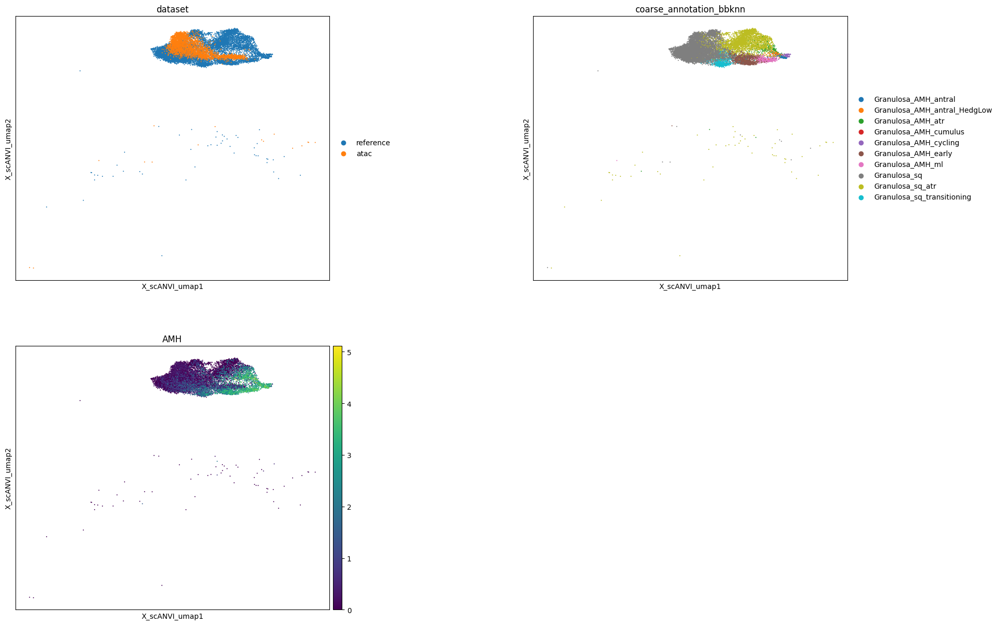

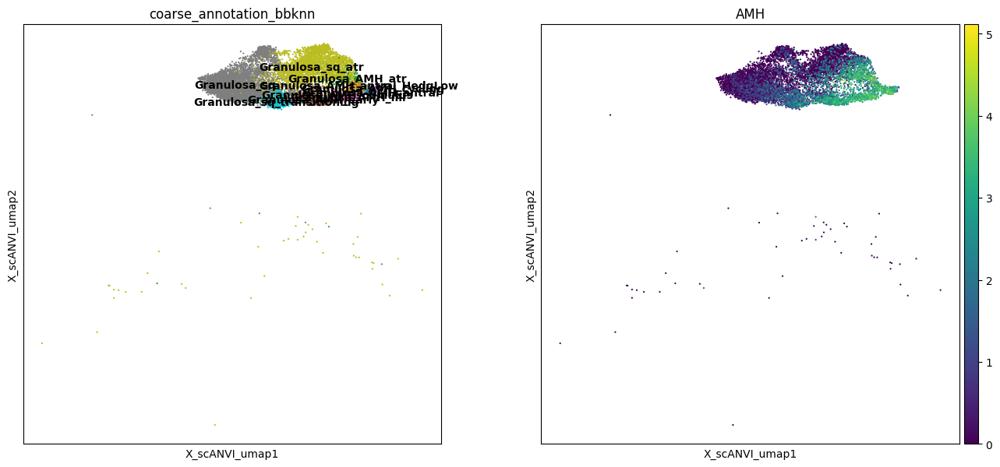

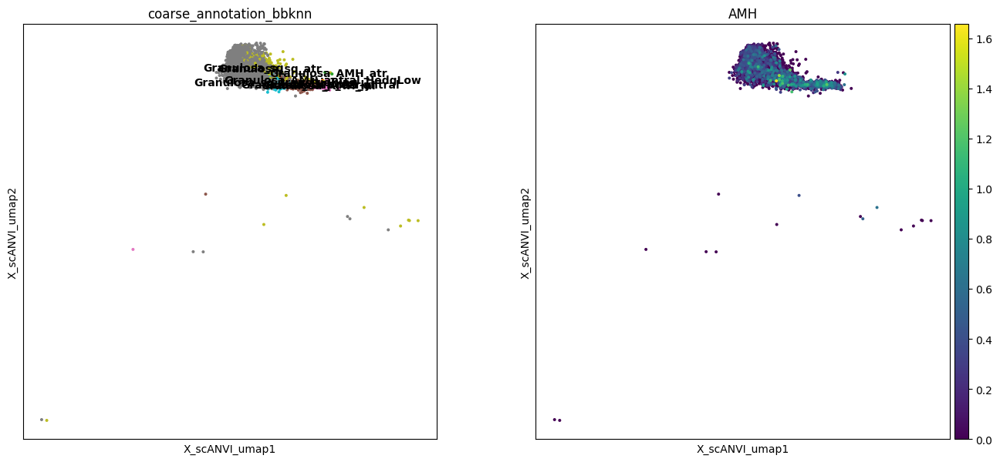

In [28]:
plt.rcParams['figure.figsize'] = [7, 7]
basis = 'X_scANVI_umap'
sc.pl.embedding(gdata,color=['dataset','coarse_annotation_bbknn','AMH'],ncols=2,basis=basis, wspace=0.5)
sc.pl.embedding(gdata[gdata.obs.dataset=='reference'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis,legend_loc='on data')
sc.pl.embedding(gdata[gdata.obs.dataset=='atac'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis, legend_loc='on data')

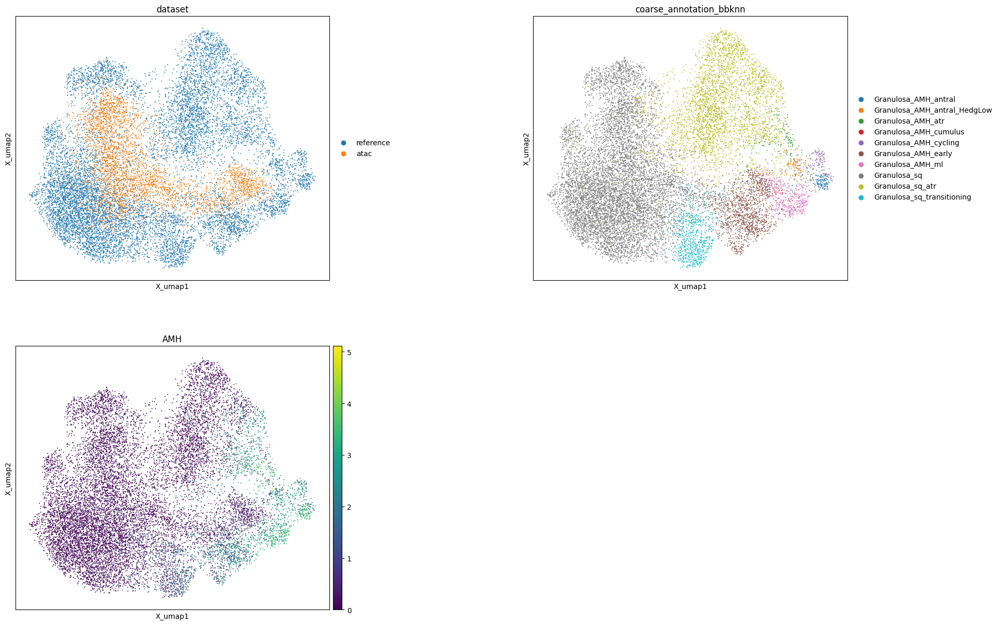

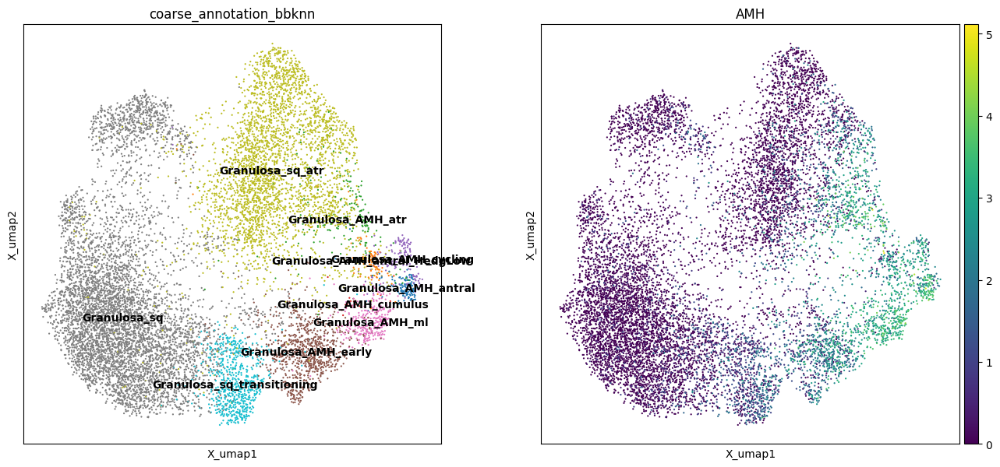

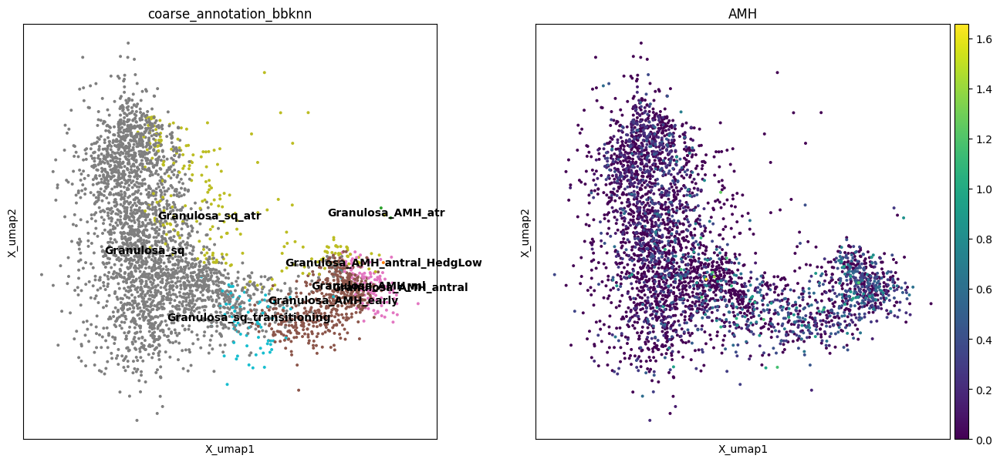

In [5]:
plt.rcParams['figure.figsize'] = [7, 7]
basis = 'X_umap' # X_scANVI_umap
sc.pl.embedding(gdata,color=['dataset','coarse_annotation_bbknn','AMH'],ncols=2,basis=basis, wspace=0.5)
sc.pl.embedding(gdata[gdata.obs.dataset=='reference'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis,legend_loc='on data')
sc.pl.embedding(gdata[gdata.obs.dataset=='atac'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis, legend_loc='on data')

# Pycistopic+ gene scores
scanvi worked horribly bad with pycistopic gene scores (see umap below)

In [8]:
# integration done using scvi/scanvi with dataset_donor as a batch (see 03.run.scanvi.sh)
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_pycistopic_gene_matrix_plus_ref_clean_scanvi.h5ad')
data.raw = sc.read_h5ad(lustre_path+'/data/combined_pycistopic_gene_matrix_plus_ref.h5ad')
data

AnnData object with n_obs × n_vars = 437310 × 5000
    obs: 'Sampling_site', 'Sample', 'Dataset', 'coarse_annotation', 'Sampling_site_II', 'Developmental_stage', 'Donor', 'Age', 'dataset', 'dataset_donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'coarse_annotation_scanvi', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'umap'
    obsm: 'X_scANVI', 'X_scANVI_umap', 'X_scVI', 'X_scVI_umap'
    obsp: 'connectivities', 'distances'

In [16]:
data.raw.X#.data

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 2752825147 stored elements and shape (437310, 15624)>

In [ ]:
# to use for knn annotation annoy is not working
sc.external.pp.bbknn(data,batch_key='dataset',use_annoy=False,neighbors_within_batch=50,use_rep='X_scANVI')

In [ ]:
sc.tl.leiden(data,resolution=0.5,key_added='leiden_0.5',flavor='igraph')
sc.tl.leiden(data,resolution=1,key_added='leiden_1',flavor='igraph')
sc.tl.leiden(data,resolution=2,key_added='leiden_2',flavor='igraph')
sc.tl.leiden(data,resolution=3,key_added='leiden_3',flavor='igraph')

(array([7.8000e+01, 3.2300e+02, 4.1490e+03, 3.6071e+04, 5.8107e+04,
        3.1175e+04, 1.0352e+04, 2.2850e+03, 2.9200e+02, 1.9000e+01]),
 array([143888.43630348, 210892.65300887, 277896.86971426, 344901.08641965,
        411905.30312504, 478909.51983044, 545913.73653583, 612917.95324122,
        679922.16994661, 746926.386652  , 813930.6033574 ]),
 <BarContainer object of 10 artists>)

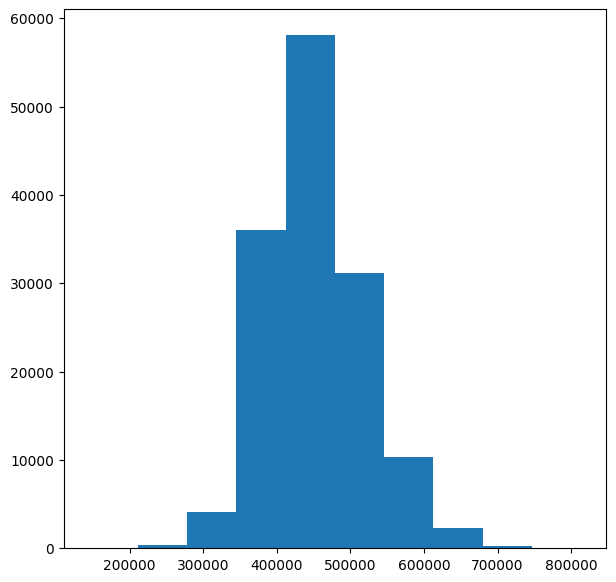

In [15]:
plt.hist(data.obs.total_counts[data.obs.dataset=='atac'])

## Check umap and predictions
C_scANVI - scanvi prediction based on coarse_annotation

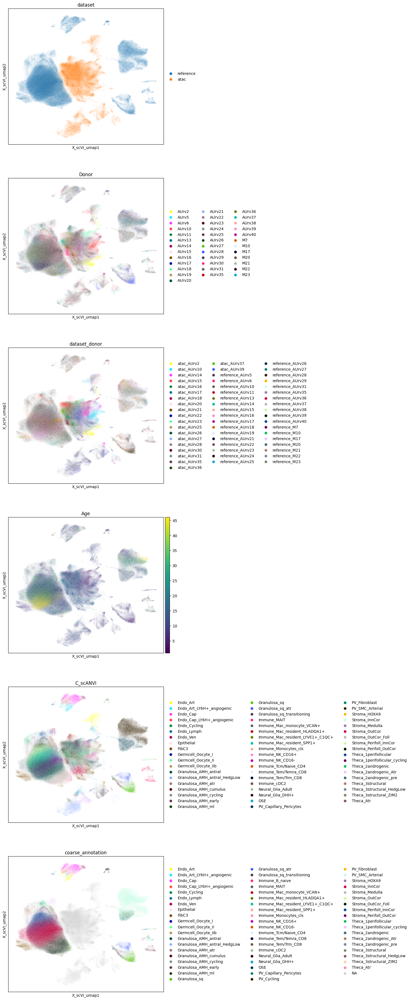

In [10]:
# looks like integration has failed
sc.pl.embedding(data,color=['dataset','Donor','dataset_donor','Age','C_scANVI','coarse_annotation'],ncols=1,basis='X_scVI_umap')

In [ ]:
# prediction is in C_scANVI
sc.pl.embedding(data,color=['dataset','Donor','dataset_donor','Age','C_scANVI','coarse_annotation'],ncols=1,basis='X_scANVI_umap')

In [ ]:
plt.rcParams['figure.figsize'] = [10, 10]
sc.pl.embedding(data[data.obs.dataset=='reference',:],color=['C_scANVI','coarse_annotation'],ncols=1,legend_loc='on data', legend_fontsize=8,basis='X_scANVI_umap')

In [ ]:
plt.rcParams['figure.figsize'] = [10, 10]
sc.pl.embedding(data[data.obs.dataset=='atac',:],color=['C_scANVI','tsse'],ncols=1,legend_loc='on data', legend_fontsize=8,basis='X_scANVI_umap')

## Check predictions in reference

In [ ]:
pd.set_option('display.max_rows', 100)
f = data.obs.dataset=='reference'
t = pd.crosstab(data.obs.coarse_annotation[f],data.obs.coarse_annotation.astype(str)[f] == data.obs.C_scANVI[f])
t['f_lost'] = t[False]/(t[False]+t[True])
t = t.sort_values(by=[False],ascending=False)
t['major_prediction'] = ''
t['major_prediction_f'] = pd.NA
for c in t.index:
    cc = data.obs.C_scANVI[f & (data.obs.coarse_annotation==c)].value_counts()
    t.loc[c,'major_prediction'] = cc.index[0]
    t.loc[c,'major_prediction_f'] = cc[0]/cc.sum()
t.sort_values(False,ascending=False)

scanvi annotation looks strange, it annotated  
**Stroma_InnCor**  as **Immune_Mac_resident_HLADQA1+**
**Stroma_Medulla** as **Theca_2androgenic**   
**Stroma_Perifoll_InnCor** as **Immune_Tem/Trm_CD8**  
So I'll use bbknn to annotate by neighbors

## Annotate ATAC

In [ ]:
%%time
res = myutils.annotateByKnn(data,knn_key = 'distances',ann_key = 'coarse_annotation')
res

In [ ]:
plt.rcParams['figure.figsize'] = [5, 5]
n=plt.hist(res.confidence[(data.obs.dataset=='reference').tolist()])
n=plt.hist(res.confidence[(data.obs.dataset=='atac').tolist()])

In [ ]:
# bbknn predicted annotation for atac and reference one for reference
data.obs['coarse_annotation_bbknn'] = res['coarse_annotation']
data.obs['coarse_annotation_bbknn'][data.obs.dataset=='reference'] = data.obs['coarse_annotation'][data.obs.dataset=='reference']
data.obs['coarse_annotation_bbknn_confidence'] = res['confidence']
data.obs['coarse_annotation_bbknn_confidence'][data.obs.dataset=='reference'] = 1
data.obs['coarse_annotation_bbknn'] = data.obs['coarse_annotation_bbknn'].astype('category')
data.obs['coarse_annotation'] = data.obs['coarse_annotation'].astype('category')

In [ ]:
cmap = plt.get_cmap('nipy_spectral')
n = len(data.obs['coarse_annotation'].cat.categories)
colors = [mcolors.to_hex(cmap(i / n)) for i in range(n)]
#colors = dict(zip(data.obs['coarse_annotation'].cat.categories, colors))
data.uns['coarse_annotation_bbknn_colors'] = colors
data.uns['coarse_annotation_colors'] = colors

In [ ]:
plt.rcParams['figure.figsize'] = [9, 9]
sc.pl.embedding(data[data.obs.dataset=='reference'],color=['coarse_annotation_bbknn'],ncols=1,legend_loc='on data',legend_fontsize=6,basis='X_scANVI_umap')

In [ ]:
sc.pl.embedding(data[data.obs.dataset=='atac'],color=['coarse_annotation_bbknn'],ncols=1,legend_loc='on data',legend_fontsize=6,basis='X_scANVI_umap')

In [ ]:
data.obs['total_counts'] = np.asarray(data.raw.X.sum(1))[:,0]
data.obs['log10_total_counts'] = np.log10(data.obs['total_counts'])

In [ ]:
sc.pl.embedding(data[data.obs.dataset=='atac'],color=['total_counts','log10_total_counts'],basis='X_scANVI_umap')

In [ ]:
data.obs.coarse_annotation_bbknn = data.obs.coarse_annotation_bbknn.str.replace('/','_')
data.obs.coarse_annotation_bbknn.value_counts()

In [ ]:
data.write_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')

### Per-cluster majority

In [ ]:
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')

In [ ]:
sc.pl.embedding(data[data.obs.dataset=='atac'],color=['leiden_0.5','leiden_1','leiden_2','leiden_3'],ncols=2,legend_loc='on data',basis='X_scVI_umap')

In [ ]:
f = data.obs.dataset=='atac'
clann = myutils.getMajorAnn(data.obs.coarse_annotation_bbknn[f],
                            data.obs.leiden_3[f])
#clann[clann.major_frac<0.5]
clann.sort_values('major_frac')

In [ ]:
len(clann.major_ann.unique())

In [ ]:
cc = data.obs.coarse_annotation_bbknn[data.obs.dataset=='atac'].value_counts()
cc[~cc.index.isin(clann.major_ann.unique())]

In [ ]:
f = data.obs.leiden_3 == '18'
pd.crosstab(data.obs.coarse_annotation_bbknn[f],data.obs.dataset[f])

## Cell type abundance in ref and atac

In [2]:
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')

In [3]:
pd.set_option('display.max_rows', 1000)
ctcounts = pd.crosstab(data.obs.coarse_annotation_bbknn,data.obs.dataset)
ctcounts['atac_odds'] = ctcounts.atac/ctcounts.atac.sum()/ctcounts.reference*ctcounts.reference.sum()
ctcounts['frac_diff'] = ctcounts.atac/ctcounts.atac.sum() - ctcounts.reference/ctcounts.reference.sum()
ctcounts['ncell_diff'] = (ctcounts['frac_diff']  * ctcounts.atac.sum()).round()
ctcounts = ctcounts.sort_values('ncell_diff',ascending=True)
ctcounts 

dataset,reference,atac,atac_iodds,frac_diff,ncell_diff
coarse_annotation_bbknn,,,,,
PV_SMC_Arterial,37594,11959,0.736939,-0.033585,-4269.0
Stroma_Medulla,16381,4784,0.676560,-0.017993,-2287.0
Stroma_Perifoll_OutCor,4880,288,0.136719,-0.014307,-1819.0
Theca_3structural_HedgLow,5217,998,0.443165,-0.009866,-1254.0
Granulosa_sq_atr,3314,226,0.157983,-0.009477,-1205.0
PV_Capillary_Pericytes,5201,1098,0.489070,-0.009025,-1147.0
Stroma_OutCor,2908,170,0.135428,-0.008538,-1085.0
Theca_3structural,2920,416,0.330039,-0.006644,-844.0
Theca_1perifollicular_cycling,1455,0,0.000000,-0.004941,-628.0


In [4]:
ctcounts[ctcounts.index.str.startswith('Granulosa')]

dataset,reference,atac,atac_iodds,frac_diff,ncell_diff
coarse_annotation_bbknn,,,,,
Granulosa_sq_atr,3314,226,0.157983,-0.009477,-1205.0
Granulosa_sq_transitioning,677,70,0.239533,-0.001748,-222.0
Granulosa_AMH_atr,188,2,0.024645,-0.000623,-79.0
Granulosa_AMH_cycling,146,0,0.000000,-0.000496,-63.0
Granulosa_AMH_antral,124,1,0.018682,-0.000413,-53.0
Granulosa_AMH_antral_HedgLow,98,1,0.023639,-0.000325,-41.0
Granulosa_AMH_cumulus,20,0,0.000000,-0.000068,-9.0
Granulosa_AMH_ml,310,136,1.016325,0.000017,2.0
Granulosa_AMH_early,841,480,1.322211,0.000920,117.0


In [5]:
ctcounts.to_csv('celltype_counts.csv')

In [ ]:
# per donor

In [26]:
f = (data.obs.dataset=='reference')
cts = ['Granulosa_sq','Granulosa_AMH_early','Granulosa_sq_atr','Granulosa_AMH_ml','Granulosa_sq_transitioning']
ref_cnts = pd.crosstab(data.obs.Donor[f],data.obs.coarse_annotation_bbknn[f]).sort_values(by='Granulosa_sq',ascending=False)
ref_cnts.loc[:,cts]

coarse_annotation_bbknn,Granulosa_sq,Granulosa_AMH_early,Granulosa_sq_atr,Granulosa_AMH_ml,Granulosa_sq_transitioning
Donor,,,,,
AUrv28,3367,118,865,48,169
AUrv22,797,37,394,0,28
AUrv29,281,111,271,11,47
AUrv25,235,21,224,3,28
AUrv11,220,89,297,73,68
AUrv6,195,123,219,0,62
AUrv40,108,0,108,0,6
AUrv17,104,26,75,5,24
AUrv36,86,12,44,2,8


In [25]:
f = (data.obs.dataset=='atac')
atac_cnts = pd.crosstab(data.obs.Donor[f],data.obs.coarse_annotation_bbknn[f]).sort_values(by='Granulosa_sq',ascending=False)
atac_cnts.loc[:,cts]

coarse_annotation_bbknn,Granulosa_sq,Granulosa_AMH_early,Granulosa_sq_atr,Granulosa_AMH_ml,Granulosa_sq_transitioning
Donor,,,,,
AUrv22,1357,58,36,0,30
AUrv28,715,21,61,15,3
AUrv14,117,214,47,67,10
AUrv16,113,7,4,0,0
AUrv17,63,22,1,3,2
AUrv36,60,6,16,0,2
AUrv23,55,7,2,0,3
AUrv35,48,40,13,1,2
AUrv27,35,0,1,0,1


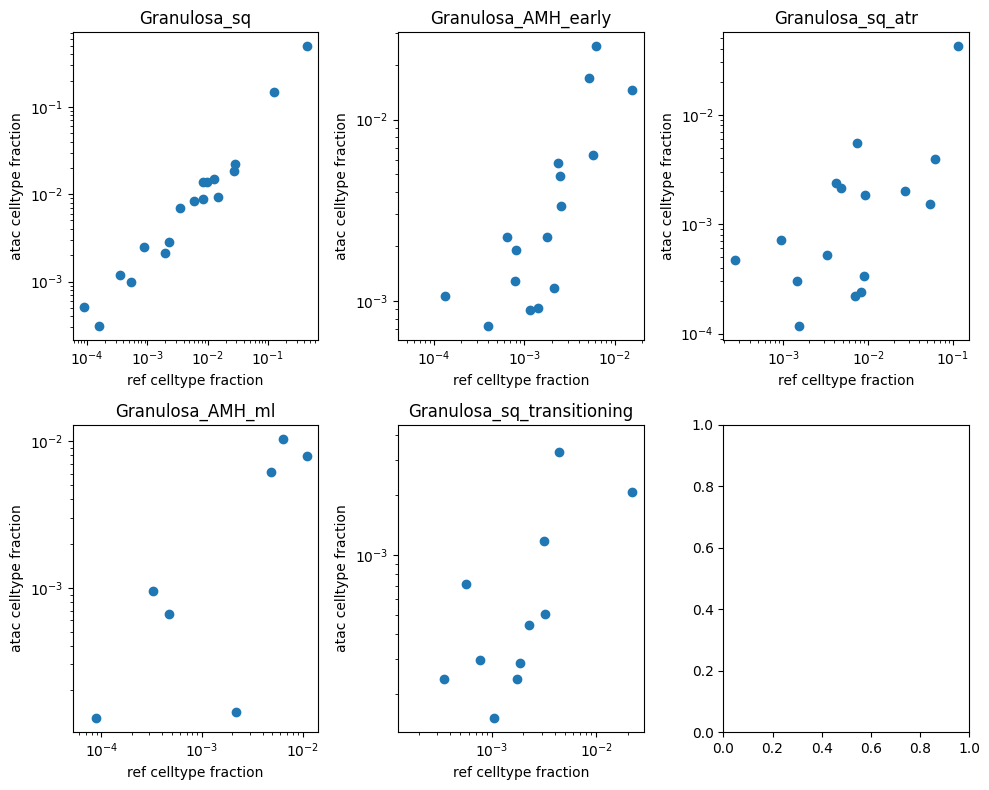

In [43]:
fig, axs = plt.subplots(2, 3, figsize=(10, 8))
axss = axs.ravel()
for i in range(len(cts)):
    ct = cts[i]
    r2a=pd.concat({'ref':ref_cnts[ct]/ref_cnts.sum(1) ,'atac':atac_cnts[ct]/atac_cnts.sum(1)}, axis=1, join='inner')
    axss[i].scatter(r2a.ref,r2a.atac)
    axss[i].set_xscale('log')
    axss[i].set_yscale('log')

    axss[i].set_xlabel('ref celltype fraction') 
    axss[i].set_ylabel('atac celltype fraction') 
    axss[i].set_title(ct)
    
plt.tight_layout()

### Save annotation

In [ ]:
obs = data.obs[data.obs.dataset=='atac']
obs['barcode'] = [x[4] for x in obs.index.str.split('[:_]')]
tmp = obs[['Sample','barcode','coarse_annotation_bbknn']]
tmp.columns = ['sample_id','barcode','celltype']
tmp.to_csv(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw_obs.csv', index=False)

## Subset to Granulosa

In [ ]:
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')
gdata = data[data.obs.coarse_annotation_bbknn.str.startswith('Granulosa'),:].copy()
gdata = gdata.raw.to_adata()
sc.pp.normalize_total(gdata)
sc.pp.log1p(gdata)
gdata

In [ ]:
pd.crosstab(data.obs.coarse_annotation_bbknn,data.obs.dataset)

In [ ]:
del gdata.uns['coarse_annotation_bbknn_colors']

In [ ]:
#sc.pp.neighbors(gdata,n_neighbors=15,use_rep='X_scANVI',key_added='scANVI_gran')
sc.external.pp.bbknn(gdata,batch_key='dataset',use_annoy=False,neighbors_within_batch=50,use_rep='X_scANVI',key_added='scANVI_gran')
sc.tl.umap(gdata,neighbors_key='scANVI_gran')
gdata

In [ ]:
plt.rcParams['figure.figsize'] = [7, 7]
basis = 'X_scANVI_umap'
sc.pl.embedding(gdata,color=['dataset','coarse_annotation_bbknn','AMH'],ncols=2,basis=basis, wspace=0.5)
sc.pl.embedding(gdata[gdata.obs.dataset=='reference'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis,legend_loc='on data')
sc.pl.embedding(gdata[gdata.obs.dataset=='atac'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis, legend_loc='on data')

In [ ]:
plt.rcParams['figure.figsize'] = [7, 7]
basis = 'X_umap' # X_scANVI_umap
sc.pl.embedding(gdata,color=['dataset','coarse_annotation_bbknn','AMH'],ncols=2,basis=basis, wspace=0.5)
sc.pl.embedding(gdata[gdata.obs.dataset=='reference'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis,legend_loc='on data')
sc.pl.embedding(gdata[gdata.obs.dataset=='atac'],color=['coarse_annotation_bbknn','AMH'],ncols=2,use_raw=False,basis=basis, legend_loc='on data')